# WEATHER PREDICTION MODEL

### AKHILA C R
### ENTRI ELEVATE
### 24-06-24

#### OVERVIEW OF THE PROBLEM STATEMENT:
WEATHER PREDICTION IS VITAL FOR SAFEGUARDING HUMAN LIFE, SUPPORTING ECONOMIC ACTIVITIES, AND MANAGING NATURAL RESOURCES EFFECTIVELY. WEATHER PREDICTION MODELS ARE VITAL TOOLS IN METEOROLOGY, HELPING SOCIETIES PREPARE FOR AN RESPOND TO VARIOUS WEATHER CONDITIONS.


#### OBJECTIVE:
TO DEVELOP THE BEST WEATHER PREDICTION MODEL USING MACHINE LEARNING TECHNIQUES

#### DATA DESCRIPTION:
SOURCE: https://www.kaggle.com/code/ariohakhamanesh/analysis-of-uk-weather-dataset/input

FEATURES:
1.	Formatted Date
2.	Time
3.	Summary
4.	Precipitate Type
5.	Temperature
6.	Apparent temperature
7.	Wind speed (Km/hr)
8.	Wind bearing (degrees)
9.	Visibility (km)
10.	Pressure (millibars)
11.	Humidity
12.	Month
13.	Day
14.	Year


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_format='retina'
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import SelectKBest,f_classif,mutual_info_classif
from sklearn.metrics import classification_report, accuracy_score
from sklearn.svm import SVC
from sklearn.metrics import f1_score,confusion_matrix
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.model_selection import cross_val_score

In [2]:
#IMPORT DATA
df=pd.read_csv("C:\\Users\\HP\\Downloads\\Climate of England _ Professional Reforms.csv")
df

,Formatted Date,Time,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Humidity,Month,Day,Year
0,4/1/2006,00:00:00.000,Partly Cloudy,rain,9.472222,7.388889,14.1197,251.0,15.8263,1015.13,0.89,4,1,2006
1,4/1/2006,01:00:00.000,Partly Cloudy,rain,9.355556,7.227778,14.2646,259.0,15.8263,1015.63,0.86,4,1,2006
2,4/1/2006,02:00:00.000,Mostly Cloudy,rain,9.377778,9.377778,3.9284,204.0,14.9569,1015.94,0.89,4,1,2006
3,4/1/2006,03:00:00.000,Partly Cloudy,rain,8.288889,5.944444,14.1036,269.0,15.8263,1016.41,0.83,4,1,2006
4,4/1/2006,04:00:00.000,Mostly Cloudy,rain,8.755556,6.977778,11.0446,259.0,15.8263,1016.51,0.83,4,1,2006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96448,9/9/2016,19:00:00.000,Partly Cloudy,rain,26.016667,26.016667,10.9963,31.0,16.1000,1014.36,0.43,9,9,2016
96449,9/9/2016,20:00:00.000,Partly Cloudy,rain,24.583333,24.583333,10.0947,20.0,15.5526,1015.16,0.48,9,9,2016
96450,9/9/2016,21:00:00.000,Partly Cloudy,rain,22.038889,22.038889,8.9838,30.0,16.1000,1015.66,0.56,9,9,2016
96451,9/9/2016,22:00:00.000,Partly Cloudy,rain,21.522222,21.522222,10.5294,20.0,16.1000,1015.95,0.60,9,9,2016


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96453 entries, 0 to 96452
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Formatted Date            96453 non-null  object 
 1   Time                      96453 non-null  object 
 2   Summary                   96453 non-null  object 
 3   Precip Type               95936 non-null  object 
 4   Temperature (C)           96453 non-null  float64
 5   Apparent Temperature (C)  96453 non-null  float64
 6   Wind Speed (km/h)         96453 non-null  float64
 7   Wind Bearing (degrees)    96453 non-null  float64
 8   Visibility (km)           96453 non-null  float64
 9   Pressure (millibars)      96453 non-null  float64
 10  Humidity                  96453 non-null  float64
 11  Month                     96453 non-null  int64  
 12  Day                       96453 non-null  int64  
 13  Year                      96453 non-null  int64  
dtypes: flo

In [4]:
df.describe()

,Temperature (C),Apparent Temperature (C),Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Humidity,Month,Day,Year
count,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.00000,96453.000000
mean,11.932678,10.855029,10.810640,187.509232,10.347325,1003.235956,0.734899,6.523799,15.72708,2011.000404
std,9.551546,10.696847,6.913571,107.383428,4.192123,116.969906,0.195473,3.448495,8.80216,3.162142
min,-21.822222,-27.716667,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.00000,2006.000000
25%,4.688889,2.311111,5.828200,116.000000,8.339800,1011.900000,0.600000,4.000000,8.00000,2008.000000
50%,12.000000,12.000000,9.965900,180.000000,10.046400,1016.450000,0.780000,7.000000,16.00000,2011.000000
75%,18.838889,18.838889,14.135800,290.000000,14.812000,1021.090000,0.890000,10.000000,23.00000,2014.000000
max,39.905556,39.344444,63.852600,359.000000,16.100000,1046.380000,1.000000,12.000000,31.00000,2016.000000


In [5]:
df.describe(include=["object","bool"])

,Formatted Date,Time,Summary,Precip Type
count,96453,96453,96453,95936
unique,4018,24,27,2
top,8/2/2010,12:00:00.000,Partly Cloudy,rain
freq,48,4019,31733,85224


In [6]:
df.rename(columns={'Formatted Date': 'Date'},inplace=True)


In [7]:
# FINDING MISSING VALUES
df.isnull().sum()

Date                          0
Time                          0
Summary                       0
Precip Type                 517
Temperature (C)               0
Apparent Temperature (C)      0
Wind Speed (km/h)             0
Wind Bearing (degrees)        0
Visibility (km)               0
Pressure (millibars)          0
Humidity                      0
Month                         0
Day                           0
Year                          0
dtype: int64

In [8]:
df.sort_values(by="Temperature (C)",ascending=False).head()


,Date,Time,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Humidity,Month,Day,Year
12759,7/22/2007,15:00:00.000,Clear,rain,39.905556,37.538889,23.5865,250.0,9.9820,1007.55,0.13,7,22,2007
12737,7/21/2007,17:00:00.000,Partly Cloudy,rain,39.588889,37.600000,12.2038,283.0,10.3523,1010.24,0.15,7,21,2007
12664,7/19/2007,16:00:00.000,Partly Cloudy,rain,38.983333,37.461111,8.9355,175.0,9.9820,1013.34,0.18,7,19,2007
12712,7/20/2007,16:00:00.000,Partly Cloudy,rain,38.983333,36.800000,15.4077,133.0,9.9820,1011.93,0.15,7,20,2007
12711,7/20/2007,15:00:00.000,Partly Cloudy,rain,38.983333,36.627778,12.7190,167.0,9.9820,1012.34,0.14,7,20,2007


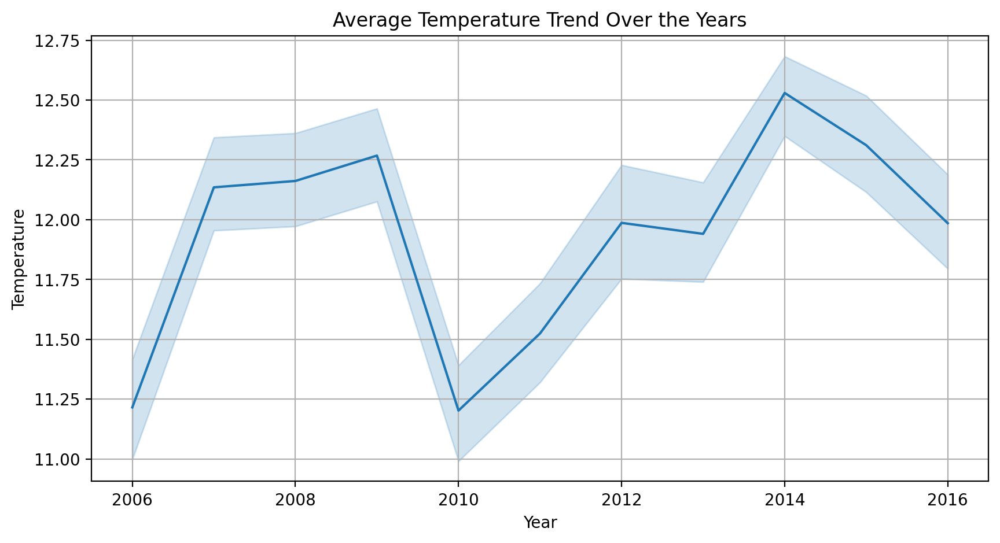

In [9]:
# Plotting temperature trends over the years
plt.figure(figsize=(10, 5))
sns.lineplot(x='Year', y='Temperature (C)', data=df)
plt.title('Average Temperature Trend Over the Years')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()

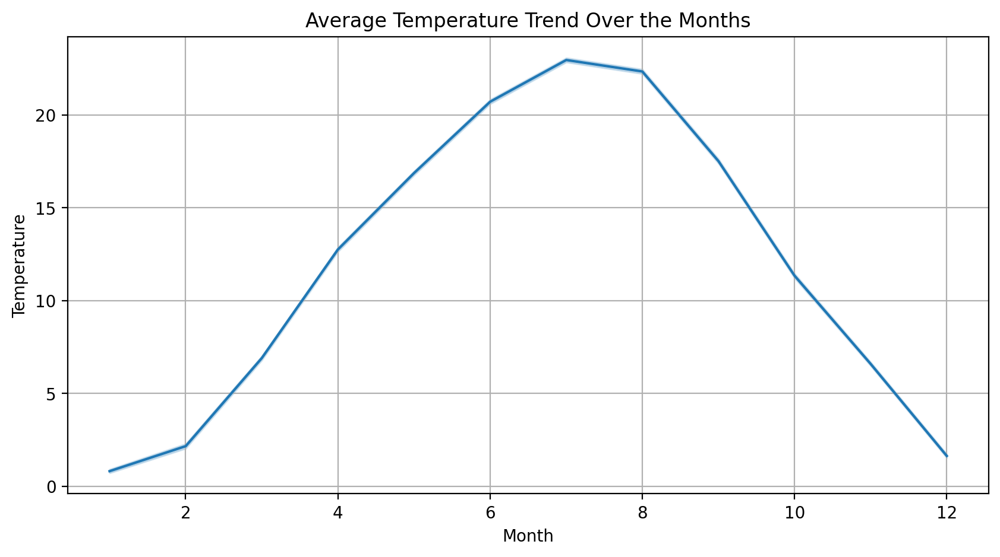

In [10]:
plt.figure(figsize=(10, 5))
sns.lineplot(x='Month', y='Temperature (C)', data=df)
plt.title('Average Temperature Trend Over the Months')
plt.xlabel('Month')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()

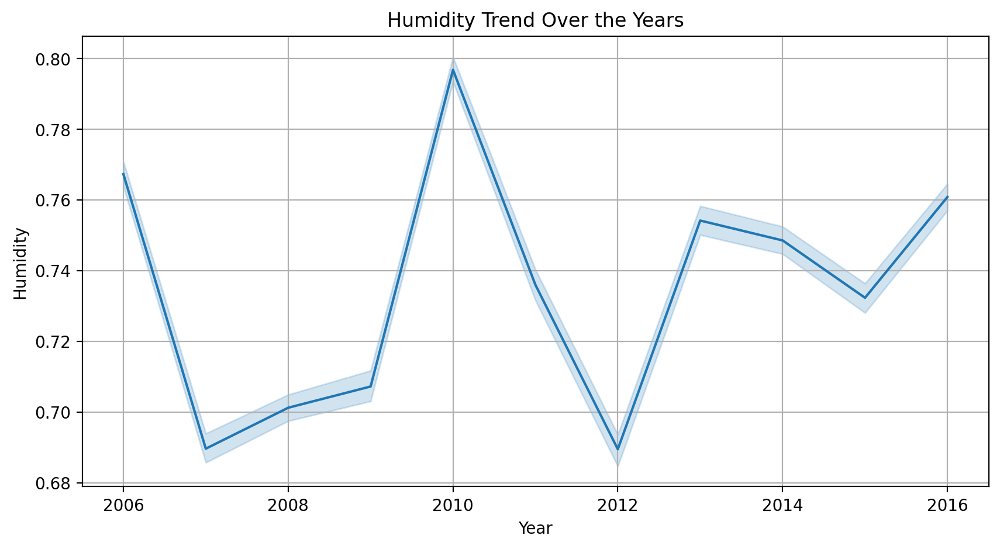

In [11]:
plt.figure(figsize=(10, 5))
sns.lineplot(x='Year', y='Humidity', data=df)
plt.title('Humidity Trend Over the Years')
plt.xlabel('Year')
plt.ylabel('Humidity')
plt.grid(True)
plt.show()

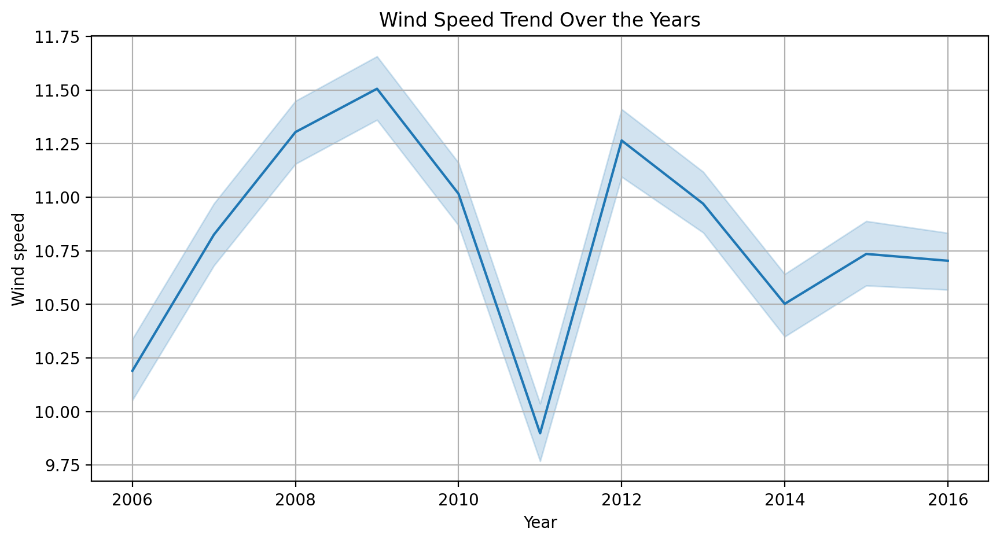

In [12]:
plt.figure(figsize=(10, 5))
sns.lineplot(x='Year', y='Wind Speed (km/h)', data=df)
plt.title('Wind Speed Trend Over the Years')
plt.xlabel('Year')
plt.ylabel('Wind speed')
plt.grid(True)
plt.show()

<Axes: xlabel='Temperature (C)', ylabel='Count'>

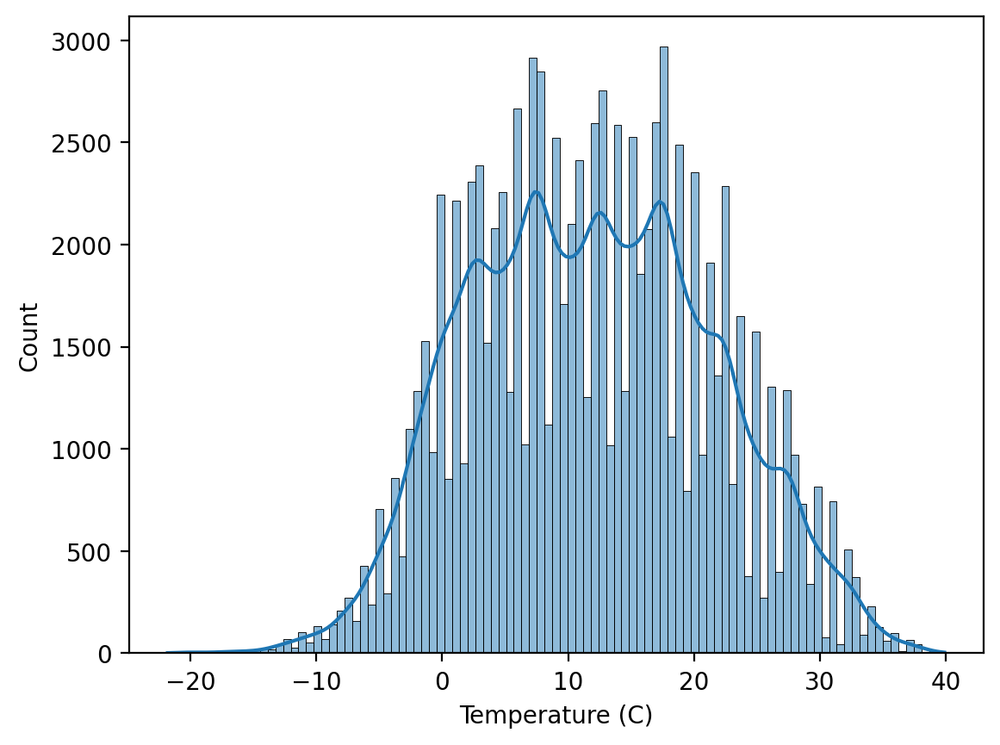

In [13]:
plt.figure()
sns.histplot(data=df,x='Temperature (C)',kde=True)

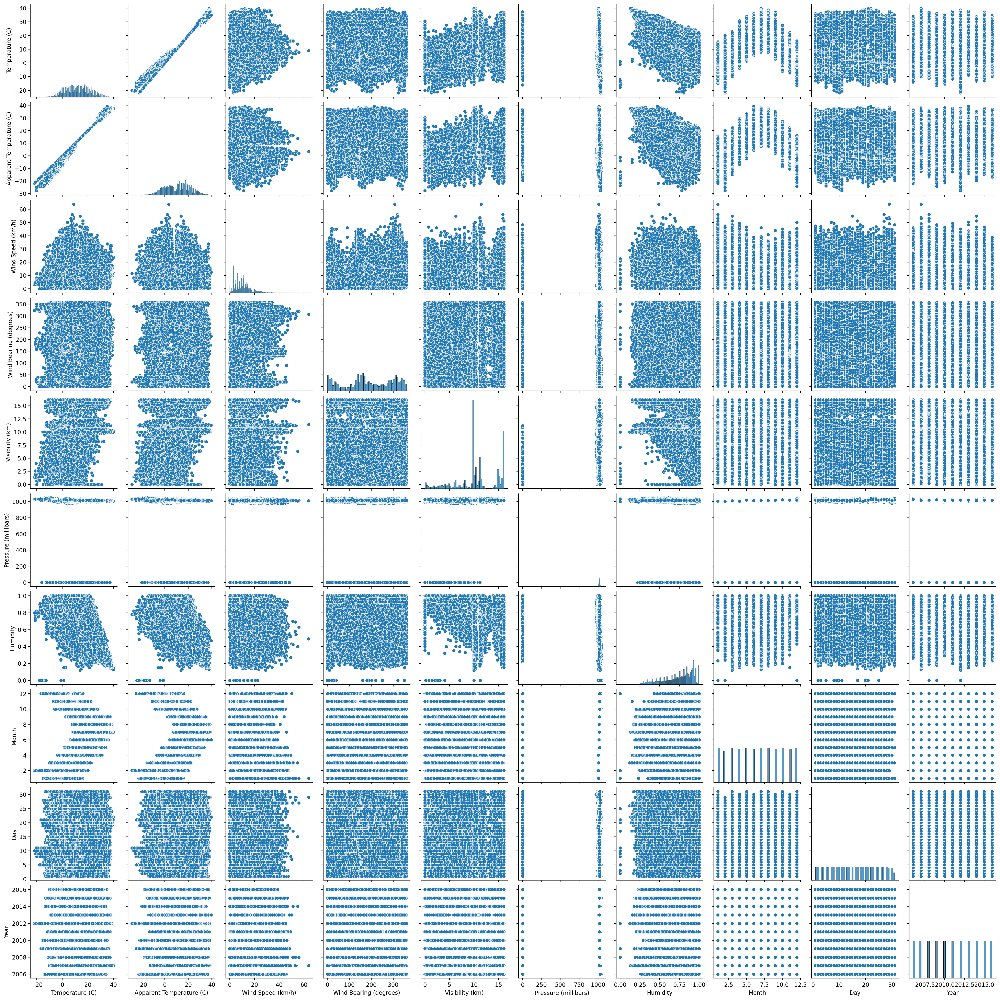

In [14]:
sns.pairplot(df)

In [15]:
df_copy=df.copy()

In [16]:
df_copy.drop(["Date","Time","Summary","Precip Type"],axis=1,inplace=True)

In [17]:
correlation_matrix=df_copy.corr()
correlation_matrix

,Temperature (C),Apparent Temperature (C),Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Humidity,Month,Day,Year
Temperature (C),1.000000,0.992629,0.008957,0.029988,0.392847,-0.005447,-0.632255,0.149110,-0.000388,0.017406
Apparent Temperature (C),0.992629,1.000000,-0.056650,0.029031,0.381718,-0.000219,-0.602571,0.158522,0.002018,0.017118
Wind Speed (km/h),0.008957,-0.056650,1.000000,0.103822,0.100749,-0.049263,-0.224951,-0.098950,-0.006131,-0.004261
Wind Bearing (degrees),0.029988,0.029031,0.103822,1.000000,0.047594,-0.011651,0.000735,-0.019092,-0.003388,-0.025696
Visibility (km),0.392847,0.381718,0.100749,0.047594,1.000000,0.059818,-0.369173,-0.071159,-0.026578,0.107268
Pressure (millibars),-0.005447,-0.000219,-0.049263,-0.011651,0.059818,1.000000,0.005454,-0.019118,-0.014860,0.016101
Humidity,-0.632255,-0.602571,-0.224951,0.000735,-0.369173,0.005454,1.000000,0.056429,0.005107,0.039289
Month,0.149110,0.158522,-0.098950,-0.019092,-0.071159,-0.019118,0.056429,1.000000,0.010547,-0.000347
Day,-0.000388,0.002018,-0.006131,-0.003388,-0.026578,-0.014860,0.005107,0.010547,1.000000,0.000474
Year,0.017406,0.017118,-0.004261,-0.025696,0.107268,0.016101,0.039289,-0.000347,0.000474,1.000000


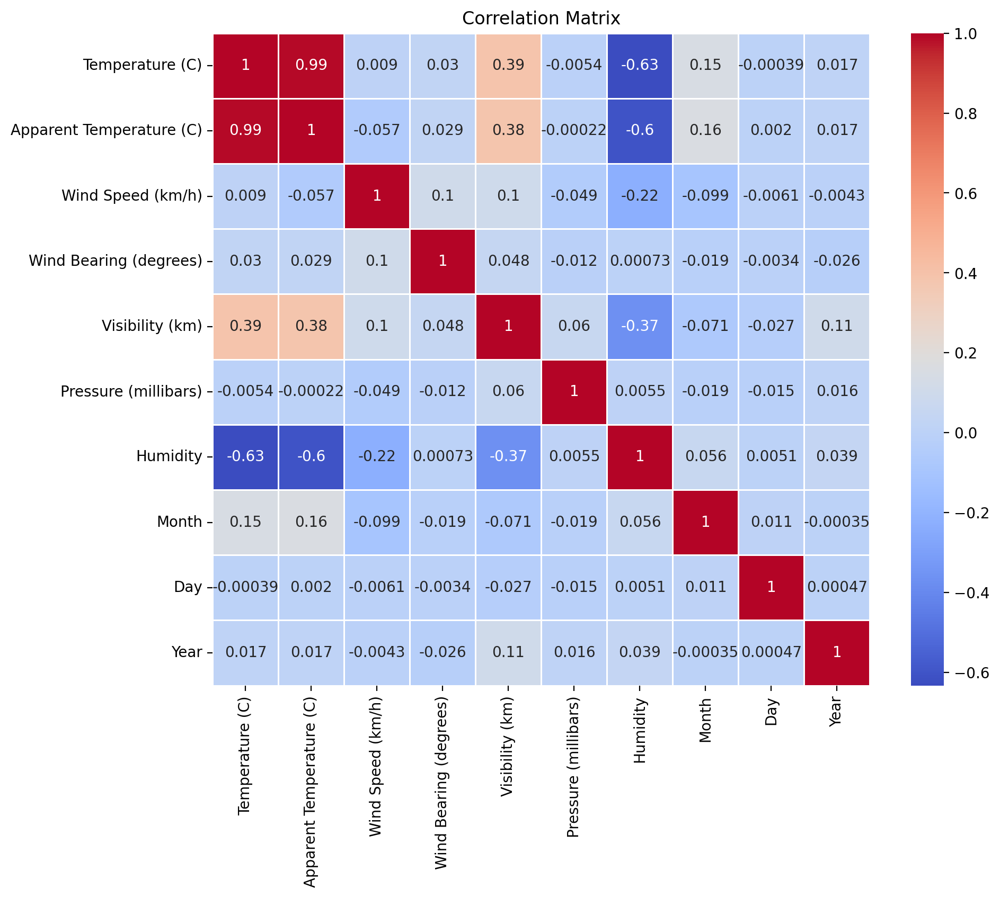

In [18]:
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix,annot=True,cmap='coolwarm',linewidth=0.5)
plt.title('Correlation Matrix')
plt.show()

In [19]:
#select numeric columns for outlier detection
numeric_columns=['Temperature (C)','Apparent Temperature (C)','Wind Speed (km/h)','Wind Bearing (degrees)','Visibility (km)','Pressure (millibars)','Humidity']

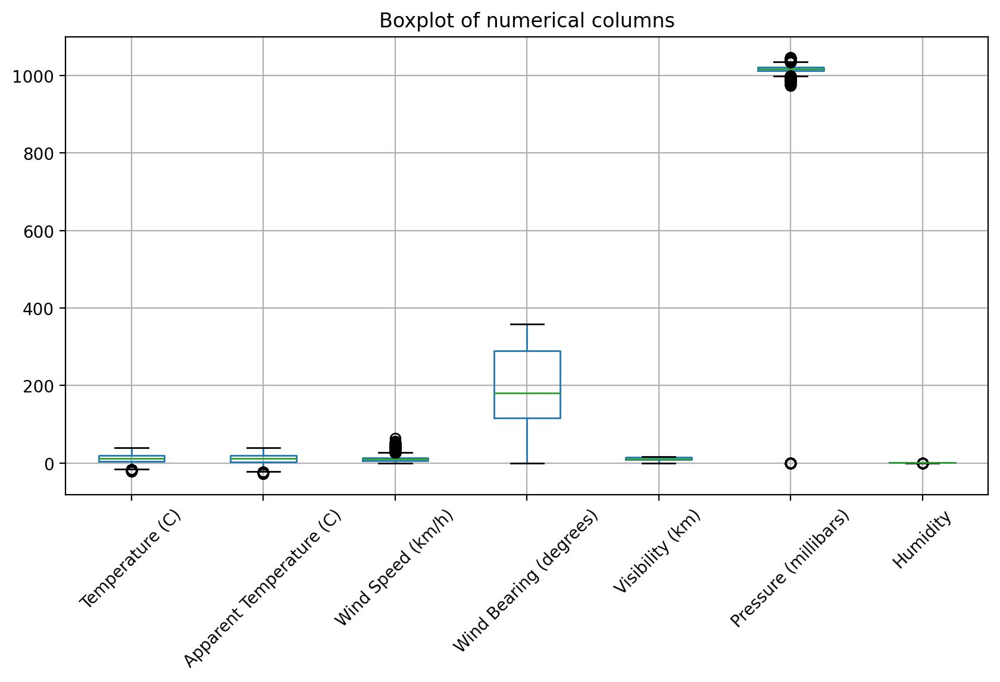

In [20]:
#visualise ouliers
df.boxplot(column=numeric_columns,figsize=(10,5))
plt.xticks(rotation=45)
plt.title("Boxplot of numerical columns")
plt.show()

In [21]:
#computing z scores
z_scores=(df[numeric_columns]-df[numeric_columns].mean())/df[numeric_columns].std()
threshold=3

In [22]:
#find outliers
outliers=(z_scores>threshold)|(z_scores<-threshold)

In [23]:
#print outliers
print("outliers:")
print(outliers.sum())

outliers:
Temperature (C)               39
Apparent Temperature (C)      40
Wind Speed (km/h)           1208
Wind Bearing (degrees)         0
Visibility (km)                0
Pressure (millibars)        1288
Humidity                      28
dtype: int64


In [24]:
def remove_outliers_zscore(df, numerical_cols, threshold=3):
    from scipy.stats import zscore

    # Calculate Z-scores
    z_scores = np.abs(df[numerical_cols].apply(zscore))

    # Filter out outliers
    df_cleaned = df[(z_scores < threshold).all(axis=1)]
    
    return df_cleaned

# Remove outliers
data_cleaned = remove_outliers_zscore(df, numeric_columns)


In [25]:

df1=data_cleaned

df1=df1.drop(columns=['Date','Time','Precip Type'])
df1

,Summary,Temperature (C),Apparent Temperature (C),Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Humidity,Month,Day,Year
0,Partly Cloudy,9.472222,7.388889,14.1197,251.0,15.8263,1015.13,0.89,4,1,2006
1,Partly Cloudy,9.355556,7.227778,14.2646,259.0,15.8263,1015.63,0.86,4,1,2006
2,Mostly Cloudy,9.377778,9.377778,3.9284,204.0,14.9569,1015.94,0.89,4,1,2006
3,Partly Cloudy,8.288889,5.944444,14.1036,269.0,15.8263,1016.41,0.83,4,1,2006
4,Mostly Cloudy,8.755556,6.977778,11.0446,259.0,15.8263,1016.51,0.83,4,1,2006
...,...,...,...,...,...,...,...,...,...,...,...
96448,Partly Cloudy,26.016667,26.016667,10.9963,31.0,16.1000,1014.36,0.43,9,9,2016
96449,Partly Cloudy,24.583333,24.583333,10.0947,20.0,15.5526,1015.16,0.48,9,9,2016
96450,Partly Cloudy,22.038889,22.038889,8.9838,30.0,16.1000,1015.66,0.56,9,9,2016
96451,Partly Cloudy,21.522222,21.522222,10.5294,20.0,16.1000,1015.95,0.60,9,9,2016


In [26]:
#seperate features(X) and target variable(Y)
X=df1.drop(columns=['Summary'])
Y=df1['Summary']
print(X)


       Temperature (C)  Apparent Temperature (C)  Wind Speed (km/h)  \
0             9.472222                  7.388889            14.1197   
1             9.355556                  7.227778            14.2646   
2             9.377778                  9.377778             3.9284   
3             8.288889                  5.944444            14.1036   
4             8.755556                  6.977778            11.0446   
...                ...                       ...                ...   
96448        26.016667                 26.016667            10.9963   
96449        24.583333                 24.583333            10.0947   
96450        22.038889                 22.038889             8.9838   
96451        21.522222                 21.522222            10.5294   
96452        20.438889                 20.438889             5.8765   

       Wind Bearing (degrees)  Visibility (km)  Pressure (millibars)  \
0                       251.0          15.8263               1015.13   
1  

In [27]:
print(Y)

0        Partly Cloudy
1        Partly Cloudy
2        Mostly Cloudy
3        Partly Cloudy
4        Mostly Cloudy
             ...      
96448    Partly Cloudy
96449    Partly Cloudy
96450    Partly Cloudy
96451    Partly Cloudy
96452    Partly Cloudy
Name: Summary, Length: 93915, dtype: object


In [28]:
#split the data into train and test sets
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=42)
                                               

In [29]:
#initilalize and train Random Forest Classifier
rf=RandomForestClassifier(random_state=42)
rf.fit(X_train,Y_train)

RandomForestClassifier(random_state=42)

In [30]:
#extract feature importance
feature_importances=rf.feature_importances_

In [31]:
#sort feature importances in descending order
sorted_indices=feature_importances.argsort()[::-1]


In [32]:
#print feature importances 
print("feature importances:")
for idx in sorted_indices:
    print(f"{X.columns[idx]}:{feature_importances[idx]}")


feature importances:
Visibility (km):0.17989581280904662
Pressure (millibars):0.12009983302896472
Wind Speed (km/h):0.10515772033936026
Humidity:0.1019406273224062
Temperature (C):0.10144698790469071
Apparent Temperature (C):0.09864393213977334
Wind Bearing (degrees):0.09492385986060006
Day:0.0839235637414767
Year:0.06259893774479522
Month:0.05136872510888617


In [33]:
#select feature based on importance
sfm=SelectFromModel(rf,threshold='median')
X_selected=sfm.fit_transform(X_train,Y_train)

In [34]:
#print selected features
selected_features=X.columns[sfm.get_support()]
print("\nSelected Features:")
print(selected_features)


Selected Features:
Index(['Temperature (C)', 'Wind Speed (km/h)', 'Visibility (km)',
       'Pressure (millibars)', 'Humidity'],
      dtype='object')


In [35]:
#initialize SelectKbest with ANOVA F-test
selector=SelectKBest(score_func=f_classif,k=5)
X_selected=selector.fit_transform(X_train,Y_train)

In [36]:
#get indices of selected features
selected_indices=selector.get_support(indices=True)

In [37]:
#get the names of selected features
selected_features=X.columns[selected_indices]

In [38]:
#print selected features
print("selected features:")
print(selected_features)

selected features:
Index(['Temperature (C)', 'Apparent Temperature (C)', 'Wind Speed (km/h)',
       'Visibility (km)', 'Humidity'],
      dtype='object')


In [39]:
#feature engineering
df1= pd.get_dummies(df1, columns=['Summary'])


In [40]:
df1

,Temperature (C),Apparent Temperature (C),Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Pressure (millibars),Humidity,Month,Day,Year,...,Summary_Dry and Partly Cloudy,Summary_Foggy,Summary_Humid and Mostly Cloudy,Summary_Humid and Overcast,Summary_Humid and Partly Cloudy,Summary_Light Rain,Summary_Mostly Cloudy,Summary_Overcast,Summary_Partly Cloudy,Summary_Rain
0,9.472222,7.388889,14.1197,251.0,15.8263,1015.13,0.89,4,1,2006,...,False,False,False,False,False,False,False,False,True,False
1,9.355556,7.227778,14.2646,259.0,15.8263,1015.63,0.86,4,1,2006,...,False,False,False,False,False,False,False,False,True,False
2,9.377778,9.377778,3.9284,204.0,14.9569,1015.94,0.89,4,1,2006,...,False,False,False,False,False,False,True,False,False,False
3,8.288889,5.944444,14.1036,269.0,15.8263,1016.41,0.83,4,1,2006,...,False,False,False,False,False,False,False,False,True,False
4,8.755556,6.977778,11.0446,259.0,15.8263,1016.51,0.83,4,1,2006,...,False,False,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96448,26.016667,26.016667,10.9963,31.0,16.1000,1014.36,0.43,9,9,2016,...,False,False,False,False,False,False,False,False,True,False
96449,24.583333,24.583333,10.0947,20.0,15.5526,1015.16,0.48,9,9,2016,...,False,False,False,False,False,False,False,False,True,False
96450,22.038889,22.038889,8.9838,30.0,16.1000,1015.66,0.56,9,9,2016,...,False,False,False,False,False,False,False,False,True,False
96451,21.522222,21.522222,10.5294,20.0,16.1000,1015.95,0.60,9,9,2016,...,False,False,False,False,False,False,False,False,True,False


In [41]:
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [42]:
# Training the model using RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_scaled, Y_train)

RandomForestClassifier(random_state=42)

In [43]:
# Predict and evaluate
y_pred = model.predict(X_test_scaled)
print(f'Accuracy: {accuracy_score(Y_test, y_pred)}')
print(classification_report(Y_test, y_pred))

Accuracy: 0.6719373901932598


C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


                          precision    recall  f1-score   support

                  Breezy       1.00      0.20      0.33         5
        Breezy and Foggy       1.00      1.00      1.00         1
Breezy and Mostly Cloudy       0.58      0.36      0.44        39
     Breezy and Overcast       0.84      0.55      0.67        49
Breezy and Partly Cloudy       0.50      0.25      0.33        20
                   Clear       0.69      0.44      0.54      2039
                 Drizzle       0.60      0.43      0.50         7
                     Dry       0.00      0.00      0.00         7
   Dry and Mostly Cloudy       0.00      0.00      0.00         1
   Dry and Partly Cloudy       0.88      0.33      0.48        21
                   Foggy       1.00      1.00      1.00      1373
 Humid and Mostly Cloudy       0.00      0.00      0.00        10
      Humid and Overcast       0.00      0.00      0.00         2
 Humid and Partly Cloudy       0.00      0.00      0.00         5
         

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [44]:
# train using support vector machine
svc_model=SVC(kernel='linear')
svc_model.fit(X_train_scaled,Y_train)
y_pred=svc_model.predict(X_test_scaled)
accuracy=accuracy_score(Y_test,y_pred)
conf_matrix=confusion_matrix(Y_test,y_pred)
print("Accuracy:",accuracy)
print("confusion matrix:\n",conf_matrix)

Accuracy: 0.5023159239738061
confusion matrix:
 [[   0    0    0    0    1    0    0    0    0    0    1    0    0    0
     0    1    0    2    0]
 [   0    0    0    0    0    0    0    0    0    0    1    0    0    0
     0    0    0    0    0]
 [   0    0   15    6    6    0    0    0    0    0    0    0    0    0
     0    7    3    2    0]
 [   0    0    5   33    1    0    0    0    0    0    0    0    0    0
     0    4    6    0    0]
 [   0    0    4    2    8    0    0    0    0    0    0    0    0    0
     0    4    0    2    0]
 [   0    0    0    0    0    0    0    0    0    0   33    0    0    0
     0  240  314 1452    0]
 [   0    0    0    0    0    0    0    0    0    0    2    0    0    0
     0    3    2    0    0]
 [   0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    7    0]
 [   0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    1    0]
 [   0    0    0    0    0    0    0    0    0    0 

In [45]:
#training usisng logistic regression
logreg=LogisticRegression(random_state=42)
logreg.fit(X_train_scaled,Y_train)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=42)

In [46]:
y_pred_logreg=logreg.predict(X_test_scaled)
accuracy_logreg=accuracy_score(Y_test,y_pred_logreg)
f1_logreg=f1_score(Y_test,y_pred_logreg,average='weighted')
print(f'Logistic Regression-Accuracy:{accuracy_logreg},F1 Score:{f1_logreg}')

Logistic Regression-Accuracy:0.4977905552893574,F1 Score:0.4724682030893286


In [47]:
#Define models
models={
    'Support Vector Machine':SVC(),
    'Multi-layer Perception(Neural Network)':MLPClassifier(),
    'Random Forest Classifier':RandomForestClassifier(),
    'Logistic Regression':LogisticRegression(),
    'Gradient Boosting Classifier':GradientBoostingClassifier()
}
#Initilalize list to store model performance
performance_data=[]
selected_features_data=[]
#Train and evaluate model
for name,model in models.items():
    #feature selection
    feature_selector=SelectKBest(score_func=mutual_info_classif)
    X_train_selected=feature_selector.fit_transform(X_train_scaled,Y_train)
    X_test_selected=feature_selector.transform(X_test_scaled)

#train and evaluate
    model.fit(X_train_selected,Y_train)
    y_train_pred=model.predict(X_train_selected)
    train_accuracy=accuracy_score(Y_train,y_train_pred)
    y_test_pred=model.predict(X_test_selected)
    test_accuracy=accuracy_score(Y_test,y_test_pred)
    

    performance_data.append({
        'Model':name,
        'Train Accuracy':train_accuracy,
        'Test Accuracy':test_accuracy
    })
performance_df=pd.DataFrame(performance_data)
performance_df

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,Model,Train Accuracy,Test Accuracy
0,Support Vector Machine,0.568679,0.548315
1,Multi-layer Perception(Neural Network),0.576013,0.554491
2,Random Forest Classifier,1.000000,0.671884
3,Logistic Regression,0.505351,0.497791
4,Gradient Boosting Classifier,0.571913,0.551350


In [64]:
print(X_train_scaled.shape)
print(Y_train.shape)


(75132, 10)
(75132,)


In [69]:
# k-fold cross validation 
scores=cross_val_score(RandomForestClassifier(),X_train_scaled,Y_train,cv=5,scoring='accuracy')
print('cross-validation scores=',scores)

cross-validation scores= [0.66254076 0.66134292 0.6622521  0.66158658 0.66132038]


In [70]:
scores.mean()

0.6618085467366426

In [71]:
# Hyperparameter tuning:Model tuning:
parameters={
    'n_estimators':[50,100],
    'max_features':['sqrt','log2',None]
}

In [72]:
grid_search=GridSearchCV(estimator=RandomForestClassifier(),
                         param_grid=parameters)

In [73]:
grid_search.fit(X_train,Y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_features': ['sqrt', 'log2', None],
                         'n_estimators': [50, 100]})

In [74]:
#Best Huper parameters
grid_search.best_params_


{'max_features': 'log2', 'n_estimators': 100}

In [75]:
Random_forest_model_new=RandomForestClassifier(max_features='log2',n_estimators=50)

In [76]:
Random_forest_model_new.fit(X_train,Y_train)

RandomForestClassifier(max_features='log2', n_estimators=50)

In [77]:
y_pred_rf=Random_forest_model_new.predict(X_test)

In [78]:
accuracy_score(Y_test,y_pred_rf)

0.6664537081403397

In [80]:
scores=cross_val_score(Random_forest_model_new,X_train_scaled,Y_train,cv=5,scoring='accuracy')
print('cross-validation scores=',scores)

cross-validation scores= [0.6584814  0.65801557 0.65566352 0.6524025  0.6574604 ]


In [81]:
scores.mean()

0.6564046785974694

### CONCLUSION:

In this project, we developed a RandomForestClassifier to predict Weather summary using other features such as temperature,humidity,pressure,wind speed. After preprocessing the data, including scaling the features and splitting the data into training and testing sets, we trained the model and evaluated its performance using 5-fold cross-validation. The model achieved an accuracy of 0.66.The model has demonstrated a moderate level of accuracy, successfully predicting the target variable in 66% of the cases.